# Baseline model for batch monitoring example

In [5]:
import requests
import datetime
import pandas as pd

from evidently import ColumnMapping
from evidently.report import Report
from evidently.metrics import ColumnDriftMetric, DatasetDriftMetric, DatasetMissingValuesMetric

from joblib import load, dump
from tqdm import tqdm

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error

In [6]:
files = [('green_tripdata_2022-02.parquet', './data'), ('green_tripdata_2024-03.parquet', './data')]

print("Download files:")
for file, path in files:
    url=f"https://d37ci6vzurychx.cloudfront.net/trip-data/{file}"
    resp=requests.get(url, stream=True)
    save_path=f"{path}/{file}"
    with open(save_path, "wb") as handle:
        for data in tqdm(resp.iter_content(),
                        desc=f"{file}",
                        postfix=f"save to {save_path}",
                        total=int(resp.headers["Content-Length"])):
            handle.write(data)

Download files:


green_tripdata_2022-02.parquet:  43%|████▎     | 610444/1428262 [00:02<00:03, 241921.15it/s, save to ./data/green_tripdata_2022-02.parquet]


KeyboardInterrupt: 

In [7]:
###
from numpy import shape


march_data = pd.read_parquet('data/green_tripdata_2024-03.parquet')
shape(march_data)

(57457, 20)

In [11]:
jan_data = pd.read_parquet('data/green_tripdata_2022-01.parquet')
jan_data.head(1)

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2022-01-01 00:14:21,2022-01-01 00:15:33,N,1.0,42,42,1.0,0.44,3.5,0.5,0.5,0.0,0.0,None,0.3,4.8,2.0,1.0,0.0


In [ ]:
##
march_data[march_data["lpep_pickup_datetime"] <= "2024-02-01 00:00:00"]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2024-03-01 00:10:52,2024-03-01 00:26:12,N,1.0,129,226,1.0,1.72,12.80,1.0,0.5,3.06,0.00,NaN,1.0,18.36,1.0,1.0,0.00
1,2,2024-03-01 00:22:21,2024-03-01 00:35:15,N,1.0,130,218,1.0,3.25,17.70,1.0,0.5,0.00,0.00,NaN,1.0,20.20,2.0,1.0,0.00
2,2,2024-03-01 00:45:27,2024-03-01 01:04:32,N,1.0,255,107,2.0,4.58,23.30,1.0,0.5,3.50,0.00,NaN,1.0,32.05,1.0,1.0,2.75
3,1,2024-03-01 00:02:00,2024-03-01 00:23:45,N,1.0,181,71,1.0,0.00,22.50,0.0,1.5,0.00,0.00,NaN,1.0,24.00,1.0,1.0,0.00
4,2,2024-03-01 00:16:45,2024-03-01 00:23:25,N,1.0,95,135,1.0,1.15,8.60,1.0,0.5,1.00,0.00,NaN,1.0,12.10,1.0,1.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57452,2,2024-03-31 21:19:00,2024-03-31 21:30:00,None,NaN,25,61,NaN,1.45,12.08,0.0,0.0,2.52,0.00,NaN,1.0,15.60,NaN,NaN,NaN
57453,2,2024-03-31 22:30:00,2024-03-31 22:35:00,None,NaN,41,42,NaN,1.13,12.24,0.0,0.0,0.00,0.00,NaN,1.0,13.24,NaN,NaN,NaN
57454,2,2024-03-31 22:43:00,2024-03-31 22:48:00,None,NaN,223,7,NaN,13062.08,12.08,0.0,0.0,3.77,0.00,NaN,1.0,16.85,NaN,NaN,NaN
57455,2,2024-03-31 22:48:00,2024-03-31 23:12:00,None,NaN,42,249,NaN,7.96,40.52,0.0,0.0,8.75,0.00,NaN,1.0,53.02,NaN,NaN,NaN


In [12]:
march_data.filter(items=['passenger_count',]).isnull().sum()

passenger_count    2097
dtype: int64

In [5]:
jan_data.shape

(62495, 20)

In [6]:
# create target
jan_data["duration_min"] = jan_data.lpep_dropoff_datetime - jan_data.lpep_pickup_datetime
jan_data.duration_min = jan_data.duration_min.apply(lambda td : float(td.total_seconds())/60)

In [7]:
# filter out outliers
jan_data = jan_data[(jan_data.duration_min >= 0) & (jan_data.duration_min <= 60)]
jan_data = jan_data[(jan_data.passenger_count > 0) & (jan_data.passenger_count <= 8)]

In [17]:
march_data["duration_min"] = march_data.lpep_dropoff_datetime - march_data.lpep_pickup_datetime
march_data.duration_min = march_data.duration_min.apply(lambda td : float(td.total_seconds())/60)
march_data = march_data[(march_data.duration_min >= 0) & (march_data.duration_min <= 60)]
march_data = march_data[(march_data.passenger_count > 0) & (march_data.passenger_count <= 8)]

In [28]:
from evidently.metrics import ColumnQuantileMetric, ColumnMissingValuesMetric

num_features = ["passenger_count", "trip_distance", "fare_amount", "total_amount"]
cat_features = ["PULocationID", "DOLocationID"]

column_mapping = ColumnMapping(
    target="fare_amount",
    numerical_features=num_features,
    categorical_features=cat_features,)

report = Report(metrics=[
    ColumnQuantileMetric(column_name="fare_amount", quantile=0.5),
    ColumnMissingValuesMetric(column_name="congestion_surcharge")])

report.run(reference_data=jan_data, current_data=march_data, column_mapping=ColumnMapping())
report.show()

<Axes: >

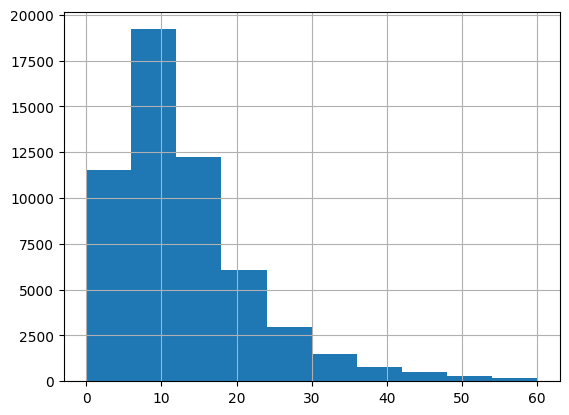

In [28]:
jan_data.duration_min.hist()

In [9]:
# data labeling
target = "duration_min"
num_features = ["passenger_count", "trip_distance", "fare_amount", "total_amount"]
cat_features = ["PULocationID", "DOLocationID"]

In [10]:
jan_data.shape

(55211, 21)

In [11]:
train_data = jan_data[:30000]
val_data = jan_data[30000:]

In [12]:
model = LinearRegression()

In [13]:
model.fit(train_data[num_features + cat_features], train_data[target])

LinearRegression()

In [14]:
train_preds = model.predict(train_data[num_features + cat_features])
train_data['prediction'] = train_preds

In [15]:
val_preds = model.predict(val_data[num_features + cat_features])
val_data['prediction'] = val_preds

In [16]:
print(mean_absolute_error(train_data.duration_min, train_data.prediction))
print(mean_absolute_error(val_data.duration_min, val_data.prediction))

3.804665373785083
4.14206407368847


# Dump model and reference data

In [17]:
with open('models/lin_reg.bin', 'wb') as f_out:
    dump(model, f_out)

In [18]:
val_data.to_parquet('data/reference.parquet')

# Evidently Report

In [19]:
column_mapping = ColumnMapping(
    target=None,
    prediction='prediction',
    numerical_features=num_features,
    categorical_features=cat_features
)

In [20]:
report = Report(metrics=[
    ColumnDriftMetric(column_name='prediction'),
    DatasetDriftMetric(),
    DatasetMissingValuesMetric()
]
)

In [21]:
report.run(reference_data=train_data, current_data=val_data, column_mapping=column_mapping)

In [22]:
report.show(mode='inline')

In [23]:
result = report.as_dict()

In [24]:
result

{'metrics': [{'metric': 'ColumnDriftMetric',
   'result': {'column_name': 'prediction',
    'column_type': 'num',
    'stattest_name': 'Wasserstein distance (normed)',
    'stattest_threshold': 0.1,
    'drift_score': 0.030493164661663727,
    'drift_detected': False,
    'current': {'small_distribution': {'x': [-36.73636669418323,
       -15.174383681787852,
       6.387599330607529,
       27.949582343002902,
       49.51156535539829,
       71.07354836779368,
       92.63553138018904,
       114.19751439258442,
       135.7594974049798,
       157.3214804173752,
       178.8834634297706],
      'y': [9.197953980857077e-06,
       0.0011092732500913634,
       0.04410786851980204,
       0.001078000206556449,
       4.598976990428536e-05,
       1.6556317165542753e-05,
       1.839590796171415e-06,
       3.67918159234283e-06,
       1.839590796171415e-06,
       3.67918159234283e-06]}},
    'reference': {'small_distribution': {'x': [-28.66907196717118,
       -9.81048482283424,
    

In [25]:
#prediction drift
result['metrics'][0]['result']['drift_score']

0.030493164661663727

In [26]:
#number of drifted columns
result['metrics'][1]['result']['number_of_drifted_columns']

0

In [27]:
#share of missing values
result['metrics'][2]['result']['current']['share_of_missing_values']

0.045454545454545456

# Evidently Dashboard

In [32]:
from evidently.metric_preset import DataDriftPreset, DataQualityPreset

from evidently.ui.workspace import Workspace
from evidently.ui.dashboards import DashboardPanelCounter, DashboardPanelPlot, CounterAgg, PanelValue, PlotType, ReportFilter
from evidently.renderers.html_widgets import WidgetSize

In [30]:
ws = Workspace("workspace")

In [31]:
project = ws.create_project("NYC Taxi Data Quality Project")
project.description = "My project descriotion"
project.save()

Project(id=UUID('fae27da1-1efd-4a08-82f7-ae423b64d123'), name='NYC Taxi Data Quality Project', description='My project descriotion', dashboard=DashboardConfig(name='NYC Taxi Data Quality Project', panels=[], tabs=[], tab_id_to_panel_ids={}), team_id=None, date_from=None, date_to=None)

In [33]:
regular_report = Report(
    metrics=[
        DataQualityPreset()
    ],
    timestamp=datetime.datetime(2022,1,28)
)

regular_report.run(reference_data=None,
                  current_data=val_data.loc[val_data.lpep_pickup_datetime.between('2022-01-28', '2022-01-29', inclusive="left")],
                  column_mapping=column_mapping)

regular_report

In [34]:
ws.add_report(project.id, regular_report)

In [35]:
#configure the dashboard
project.dashboard.add_panel(
    DashboardPanelCounter(
        filter=ReportFilter(metadata_values={}, tag_values=[]),
        agg=CounterAgg.NONE,
        title="NYC taxi data dashboard"
    )
)

project.dashboard.add_panel(
    DashboardPanelPlot(
        filter=ReportFilter(metadata_values={}, tag_values=[]),
        title="Inference Count",
        values=[
            PanelValue(
                metric_id="DatasetSummaryMetric",
                field_path="current.number_of_rows",
                legend="count"
            ),
        ],
        plot_type=PlotType.BAR,
        size=WidgetSize.HALF,
    ),
)

project.dashboard.add_panel(
    DashboardPanelPlot(
        filter=ReportFilter(metadata_values={}, tag_values=[]),
        title="Number of Missing Values",
        values=[
            PanelValue(
                metric_id="DatasetSummaryMetric",
                field_path="current.number_of_missing_values",
                legend="count"
            ),
        ],
        plot_type=PlotType.LINE,
        size=WidgetSize.HALF,
    ),
)

project.save()

Project(id=UUID('fae27da1-1efd-4a08-82f7-ae423b64d123'), name='NYC Taxi Data Quality Project', description='My project descriotion', dashboard=DashboardConfig(name='NYC Taxi Data Quality Project', panels=[DashboardPanelCounter(type='evidently.ui.dashboards.reports.DashboardPanelCounter', id=UUID('f86ffa03-5059-4320-8de7-efc23a227c4c'), title='NYC taxi data dashboard', filter=ReportFilter(metadata_values={}, tag_values=[], include_test_suites=False), size=<WidgetSize.FULL: 2>, agg=<CounterAgg.NONE: 'none'>, value=None, text=None), DashboardPanelPlot(type='evidently.ui.dashboards.reports.DashboardPanelPlot', id=UUID('ffdef20b-0e95-4a3a-b925-24df3a7450b3'), title='Inference Count', filter=ReportFilter(metadata_values={}, tag_values=[], include_test_suites=False), size=<WidgetSize.HALF: 1>, values=[PanelValue(field_path='current.number_of_rows', metric_id='DatasetSummaryMetric', metric_hash=None, metric_args={}, legend='count')], plot_type=<PlotType.BAR: 'bar'>), DashboardPanelPlot(type='e

In [36]:
regular_report = Report(
    metrics=[
        DataQualityPreset()
    ],
    timestamp=datetime.datetime(2022,1,29)
)

regular_report.run(reference_data=None,
                  current_data=val_data.loc[val_data.lpep_pickup_datetime.between('2022-01-29', '2022-01-30', inclusive="left")],
                  column_mapping=column_mapping)

regular_report

In [37]:
ws.add_report(project.id, regular_report)